#  Importing libraries

In [1]:
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap

#  Load the Uber trips Dataset

In [4]:
# Load the Uber trips Dataset
Uber_df = pd.read_csv(r"C:\uber-raw-data-sep14.csv")

# Data Overview

In [5]:
# Data Overview
print(Uber_df.shape)
print(Uber_df.info())
print(Uber_df.columns)

(1028136, 4)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1028136 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   Date/Time  1028136 non-null  object 
 1   Lat        1028136 non-null  float64
 2   Lon        1028136 non-null  float64
 3   Base       1028136 non-null  object 
dtypes: float64(2), object(2)
memory usage: 31.4+ MB
None
Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')


# Summary Statistics

In [6]:
# Summary Statistics
print(Uber_df.describe())

                Lat           Lon
count  1.028136e+06  1.028136e+06
mean   4.073922e+01 -7.397182e+01
std    4.082861e-02  5.831413e-02
min    3.998970e+01 -7.477360e+01
25%    4.072040e+01 -7.399620e+01
50%    4.074180e+01 -7.398310e+01
75%    4.076120e+01 -7.396280e+01
max    4.134760e+01 -7.271630e+01


# Data cleaning

In [7]:
# Data Cleaning: Check for Missing Values and Duplicates

print(Uber_df.duplicated().sum())
# Drop Duplicates
Uber_df.drop_duplicates(inplace=True)

24037


# Check for Missing Values

In [8]:
print(Uber_df.isnull().sum())

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64





# Check outliers 

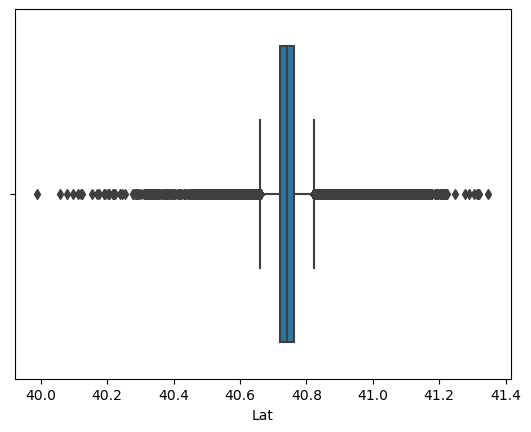

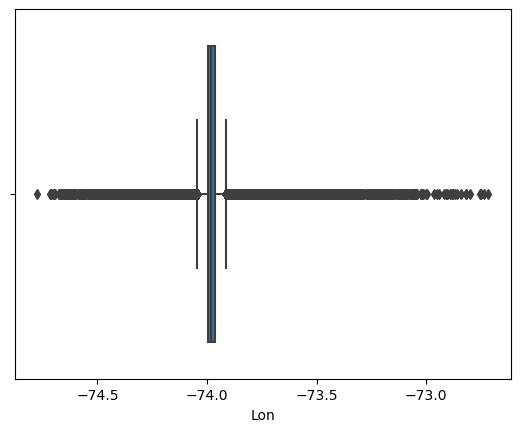

In [9]:
# Outliers check using boxplots for Latitude and Longitude
sns.boxplot(x="Lat", data=Uber_df)
plt.show()

sns.boxplot(x="Lon", data=Uber_df)
plt.show()

In [10]:
# IQR method to filter out outliers
Q1_lon = Uber_df['Lon'].quantile(0.25)
Q3_lon = Uber_df['Lon'].quantile(0.75)
IQR_lon = Q3_lon - Q1_lon
lower_bound_lon = Q1_lon - 1.5 * IQR_lon
upper_bound_lon = Q3_lon + 1.5 * IQR_lon

Q1_lat = Uber_df['Lat'].quantile(0.25)
Q3_lat = Uber_df['Lat'].quantile(0.75)
IQR_lat = Q3_lat - Q1_lat
lower_bound_lat = Q1_lat - 1.5 * IQR_lat
upper_bound_lat = Q3_lat + 1.5 * IQR_lat

In [11]:
# Filter out the rows with outliers
Uber_df_cleaned_data = Uber_df[(Uber_df['Lon'] >= lower_bound_lon) & (Uber_df['Lon'] <= upper_bound_lon) &
                               (Uber_df['Lat'] >= lower_bound_lat) & (Uber_df['Lat'] <= upper_bound_lat)]

# Feature Engineering

In [12]:
# Feature Engineering: Convert 'Date/Time' to datetime and extract additional features
Uber_df_cleaned_data['Date/Time'] = pd.to_datetime(Uber_df_cleaned_data['Date/Time'])
Uber_df_cleaned_data['hour'] = Uber_df_cleaned_data['Date/Time'].dt.hour
Uber_df_cleaned_data['day_of_week'] = Uber_df_cleaned_data['Date/Time'].dt.day_name()
Uber_df_cleaned_data['month'] = Uber_df_cleaned_data['Date/Time'].dt.month_name()

# Trips by Hour of the Day 

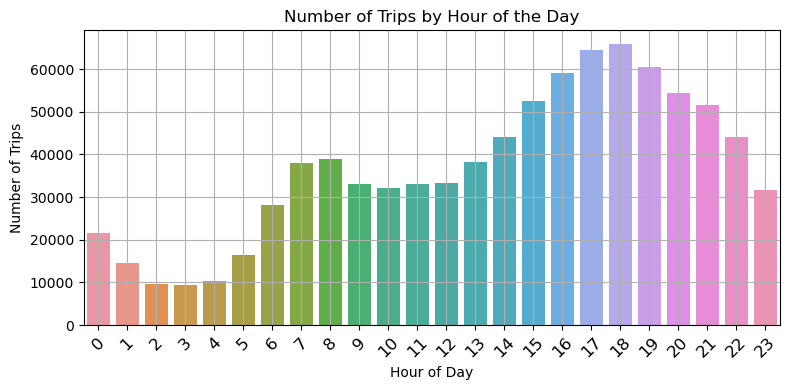

In [13]:
# 1. **Trips by Hour of the Day (Bar Plot)**
plt.figure(figsize=(8, 4))
sns.countplot(data=Uber_df_cleaned_data, x='hour')
plt.title('Number of Trips by Hour of the Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45, fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Trip over Time (Day)

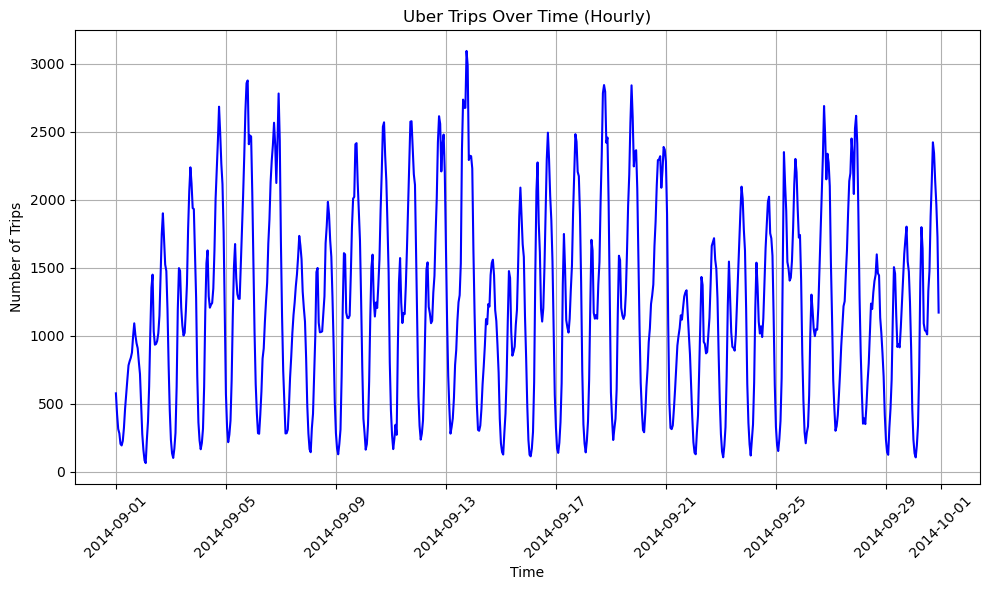

In [14]:
# 2. **Trip Over Time (Hourly)** - Resample by hour and plot
Uber_df_cleaned_data.set_index('Date/Time', inplace=True)
trips_by_hour = Uber_df_cleaned_data.resample('H').size()

plt.figure(figsize=(10, 6))
plt.plot(trips_by_hour.index, trips_by_hour.values, color='blue')
plt.title('Uber Trips Over Time (Hourly)')
plt.xlabel('Time')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Trips by Hour of the Day (Pie chart)

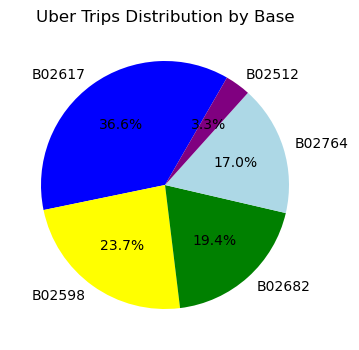

In [15]:
# 3. **Trips by Base (Pie Chart)**
trips_by_base = Uber_df_cleaned_data['Base'].value_counts()

plt.figure(figsize=(4, 6))
plt.pie(trips_by_base.values, labels=trips_by_base.index, autopct='%0.1f%%', colors=['blue', 'yellow', 'green', 'lightblue', 'purple'], startangle=60)
plt.title('Uber Trips Distribution by Base')
plt.show()

# Trips per Day of the Week (Bar Plot)

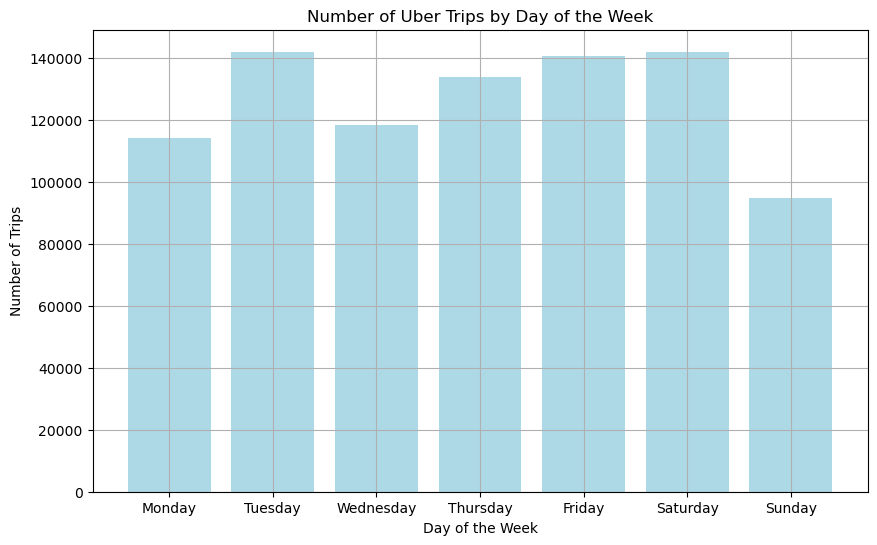

In [16]:
# 4. **Trips per Day of the Week (Bar Plot)**
trips_by_day = Uber_df_cleaned_data['day_of_week'].value_counts()
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
trips_by_day = trips_by_day.reindex(days_order, fill_value=0)

plt.figure(figsize=(10, 6))
plt.bar(trips_by_day.index, trips_by_day.values, color='lightblue')
plt.title('Number of Uber Trips by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Trips')
plt.grid(True)
plt.show()

# Percent of Trips by Day of the Week (Pie Chart)

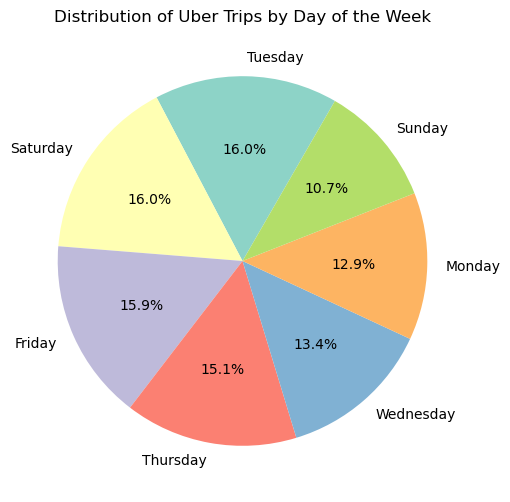

In [27]:
# 6. **Trips by Day of the Week (Pie Chart)**
trips_by_day = Uber_df_cleaned_data['day_of_week'].value_counts()

plt.figure(figsize=(8, 6))
plt.pie(trips_by_day.values, labels=trips_by_day.index, autopct='%1.1f%%', colors=sns.color_palette("Set3", n_colors=7), startangle=60)
plt.title('Distribution of Uber Trips by Day of the Week')
plt.show()

# Geospatial Distribution of Trips

In [18]:
# 7. **Geospatial Distribution of Trips (Scatter Plot on Map)** using Folium
map_center = [Uber_df_cleaned_data['Lat'].mean(), Uber_df_cleaned_data['Lon'].mean()]
uber_map = folium.Map(location=map_center, zoom_start=12)

In [19]:
# Plot each trip's lat/lon as a marker on the map
for idx, row in Uber_df_cleaned_data.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Lon']],
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(uber_map)

In [21]:
# 8. **Geospatial Analysis with Heatmaps** (Pickup and Dropoff Locations)
pickup_points = Uber_df_cleaned_data[['Lat', 'Lon']].dropna().values.tolist()

pickup_map = folium.Map(location=map_center, zoom_start=12)
pickup_heatmap = HeatMap(pickup_points, radius=15, max_zoom=13)
pickup_map.add_child(pickup_heatmap)

# Box Plot of Trips by Hour of the Day

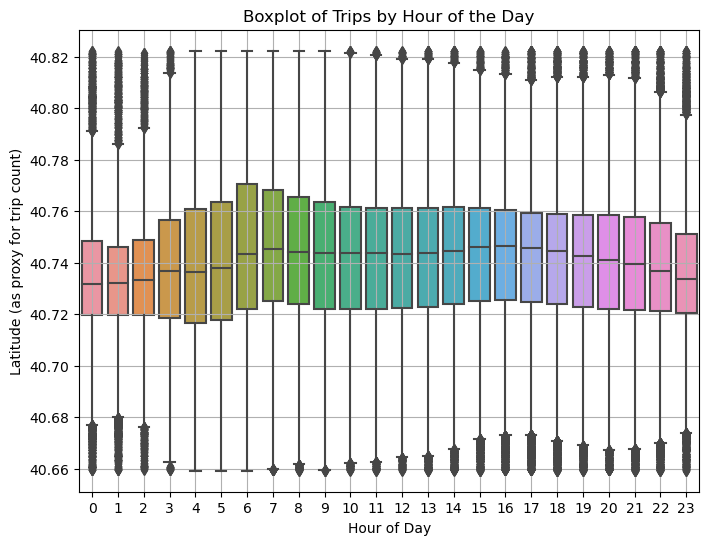

In [23]:

# **Box Plot of Trips by Hour of the Day**
plt.figure(figsize=(8, 6))
sns.boxplot(data=Uber_df_cleaned_data, x='hour', y='Lat')  # Assuming 'Lat' is a proxy for trip count
plt.title('Boxplot of Trips by Hour of the Day')
plt.xlabel('Hour of Day')
plt.ylabel('Latitude (as proxy for trip count)')
plt.grid(True)
plt.show()

# Distribution of Latitudes and Longitudes (Histograms)

Text(0, 0.5, 'Frequency')

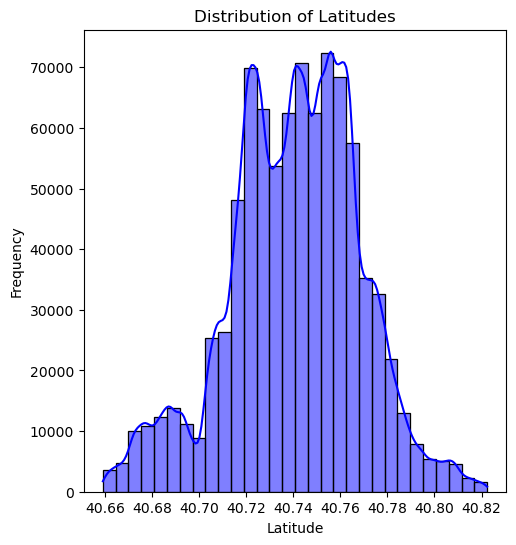

In [24]:
# 10. **Distribution of Latitudes and Longitudes (Histograms)**
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(Uber_df_cleaned_data['Lat'], bins=30, color='blue', kde=True)
plt.title('Distribution of Latitudes')
plt.xlabel('Latitude')
plt.ylabel('Frequency')

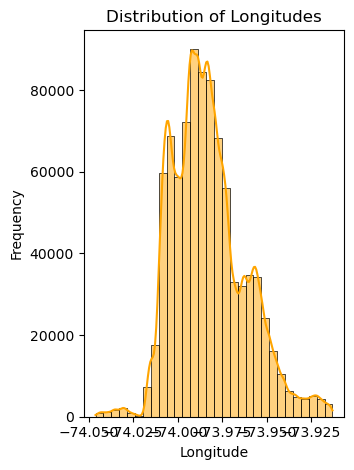

In [25]:
plt.subplot(1, 2, 2)
sns.histplot(Uber_df_cleaned_data['Lon'], bins=30, color='orange', kde=True)
plt.title('Distribution of Longitudes')
plt.xlabel('Longitude')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Correlation Analysis

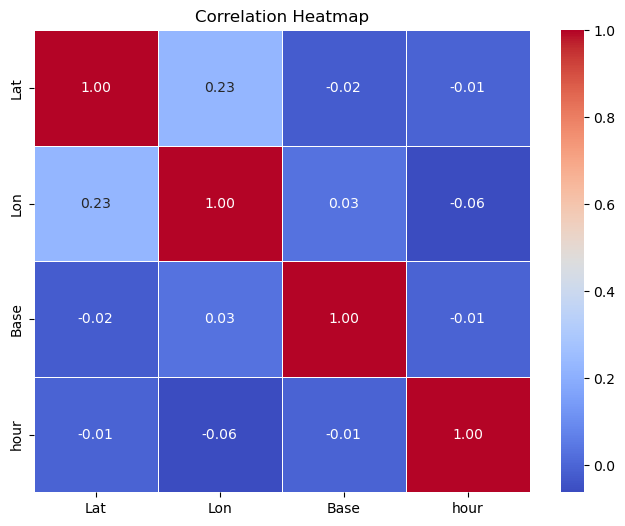

In [26]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Encode categorical column
label_encoder = LabelEncoder()
Uber_df_cleaned_data['Base'] = label_encoder.fit_transform(Uber_df_cleaned_data['Base'])

# Select numeric columns
numeric_data = Uber_df_cleaned_data.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix = numeric_data.corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()
